# Ce projet consiste prédire avec précision le futur prix de l'or

## Présentation des données
L'ensemble de données comporte : le prix du pétrole, l'indice Standard and Poor's , les taux des obligations américaines de l'indice Dow Jones (10 ans), les taux de change Euro USD, les prix des métaux précieux argent et platine et d'autres métaux tels que le palladium et le rhodium, Les prix de l'indice du dollar américain, de l'Eldorado Gold Corporation et de l'ETF Gold Miner

### Explication des Variables
ETF Gold est un type de fonds négocié en bourse (ETF) conçu pour fluctuer à mesure que le prix du marché des lingots d'or monte et descend.

Le S&P 500 (SP) est un indice boursier basé sur 500 grandes sociétés cotées sur les bourses aux États-Unis.

Le Dow Jones(DJ) est le plus vieil indice boursier du monde et des Bourses de New York. Cet indice, regroupe trente entreprises importantes, telles que Microsoft, VISA ou encore Walt Disney Company...

Eldorado Gold Corporation (EGO):Eldorado Gold Corporation est une société canadienne qui possède et exploite des mines d’or

 taux de change Euro USD(EU)
 
Contrats à terme sur le pétrole brut(OF):C'est un contrat financier qui permet de vendre en avance le petrole

Pétrole ETF (USO)
ETF des mineurs d'or(GDX)
Indice du dollar américain(USDI)
Rhodium(RHO)
Prix du palladium(PLD)
Prix du platine(PLD) 
Gold ETF :- Adjusted Close


### Importation des bibliotheques

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
from sklearn.preprocessing import RobustScaler

In [2]:
#chargement du jeu de données
data_gold = pd.read_csv('C:/Users/Admin/Documents/MTN ACADEMY/GOLD/FINAL_USO.csv')
data_gold

,Date,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
0,2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
1,2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2,2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
3,2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
4,2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1713,2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,...,20.650000,21.090000,21.090000,60507000,9.490000,9.520000,9.280000,9.290000,9.290000,21598200
1714,2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,...,20.530001,20.620001,20.620001,76365200,9.250000,9.920000,9.230000,9.900000,9.900000,40978800
1715,2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,...,20.700001,20.969999,20.969999,52393000,9.590000,9.650000,9.370000,9.620000,9.620000,36578700
1716,2018-12-28,120.800003,121.080002,120.720001,121.059998,121.059998,6864700,249.580002,251.399994,246.449997,...,20.570000,20.600000,20.600000,49835000,9.540000,9.650000,9.380000,9.530000,9.530000,22803400


In [3]:
# affichage des 5 premiere lignes
data_gold.head()

,Date,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
0,2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
1,2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2,2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
3,2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
4,2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [4]:
#affichage des 5 derniere ligne
data_gold.tail()

,Date,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
1713,2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,...,20.650000,21.090000,21.090000,60507000,9.49,9.52,9.28,9.29,9.29,21598200
1714,2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,...,20.530001,20.620001,20.620001,76365200,9.25,9.92,9.23,9.90,9.90,40978800
1715,2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,...,20.700001,20.969999,20.969999,52393000,9.59,9.65,9.37,9.62,9.62,36578700
1716,2018-12-28,120.800003,121.080002,120.720001,121.059998,121.059998,6864700,249.580002,251.399994,246.449997,...,20.570000,20.600000,20.600000,49835000,9.54,9.65,9.38,9.53,9.53,22803400
1717,2018-12-31,120.980003,121.260002,120.830002,121.250000,121.250000,8449400,249.559998,250.190002,247.470001,...,20.559999,21.090000,21.090000,53866600,9.63,9.71,9.44,9.66,9.66,28417400


In [5]:
#nombre de ligne et de colonnes
data_gold.shape

(1718, 81)

In [6]:
var = data_gold.columns
var

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume',
       'SP_open', 'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume',
       'DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume',
       'EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume',
       'EU_Price', 'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price',
       'OF_Open', 'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price',
       'OS_Open', 'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open',
       'SF_High', 'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open',
       'USB_High', 'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High',
       'PLT_Low', 'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_Hig

In [7]:
data_gold.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1718 entries, 0 to 1717
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           1718 non-null   object 
 1   Open           1718 non-null   float64
 2   High           1718 non-null   float64
 3   Low            1718 non-null   float64
 4   Close          1718 non-null   float64
 5   Adj Close      1718 non-null   float64
 6   Volume         1718 non-null   int64  
 7   SP_open        1718 non-null   float64
 8   SP_high        1718 non-null   float64
 9   SP_low         1718 non-null   float64
 10  SP_close       1718 non-null   float64
 11  SP_Ajclose     1718 non-null   float64
 12  SP_volume      1718 non-null   int64  
 13  DJ_open        1718 non-null   float64
 14  DJ_high        1718 non-null   float64
 15  DJ_low         1718 non-null   float64
 16  DJ_close       1718 non-null   float64
 17  DJ_Ajclose     1718 non-null   float64
 18  DJ_volum

In [8]:
# les valeurs manquantes
data_gold.isnull().sum()
#pas de valeures manquantes

Date             0
Open             0
High             0
Low              0
Close            0
                ..
USO_High         0
USO_Low          0
USO_Close        0
USO_Adj Close    0
USO_Volume       0
Length: 81, dtype: int64

In [9]:
data_gold.describe()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,...,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03
mean,127.323434,127.854237,126.777695,127.319482,127.319482,8.446327e+06,204.490023,205.372637,203.487014,204.491222,...,26.384575,26.715012,25.924624,4.356515e+07,22.113417,22.307148,21.904657,22.109051,22.109051,1.922313e+07
std,17.526993,17.631189,17.396513,17.536269,17.536269,4.920731e+06,43.831928,43.974644,43.618940,43.776999,...,10.490908,10.603110,9.886570,2.909151e+07,11.431056,11.478671,11.373997,11.432787,11.432787,1.575743e+07
min,100.919998,100.989998,100.230003,100.500000,100.500000,1.501600e+06,122.059998,122.320000,120.029999,120.290001,...,12.400000,12.470000,12.269618,4.729000e+06,7.820000,8.030000,7.670000,7.960000,7.960000,1.035100e+06
25%,116.220001,116.540001,115.739998,116.052502,116.052502,5.412925e+06,170.392498,170.962506,169.577499,170.397500,...,20.355000,20.585000,20.180950,2.259968e+07,11.420000,11.500000,11.300000,11.392500,11.392500,6.229500e+06
50%,121.915001,122.325001,121.369999,121.795002,121.795002,7.483900e+06,205.464996,206.459999,204.430000,205.529998,...,22.870001,23.054999,22.677603,3.730465e+07,16.450000,16.635001,16.040000,16.345000,16.345000,1.613015e+07
75%,128.427494,129.087497,127.840001,128.470001,128.470001,1.020795e+07,237.292500,237.722500,236.147502,236.889996,...,26.797500,27.317500,26.478154,5.697055e+07,34.419998,34.667499,34.110000,34.417499,34.417499,2.672375e+07
max,173.199997,174.070007,172.919998,173.610001,173.610001,9.380420e+07,293.089996,293.940002,291.809998,293.579987,...,56.770000,57.470001,54.617039,2.321536e+08,41.599998,42.299999,41.299999,42.009998,42.009998,1.102657e+08


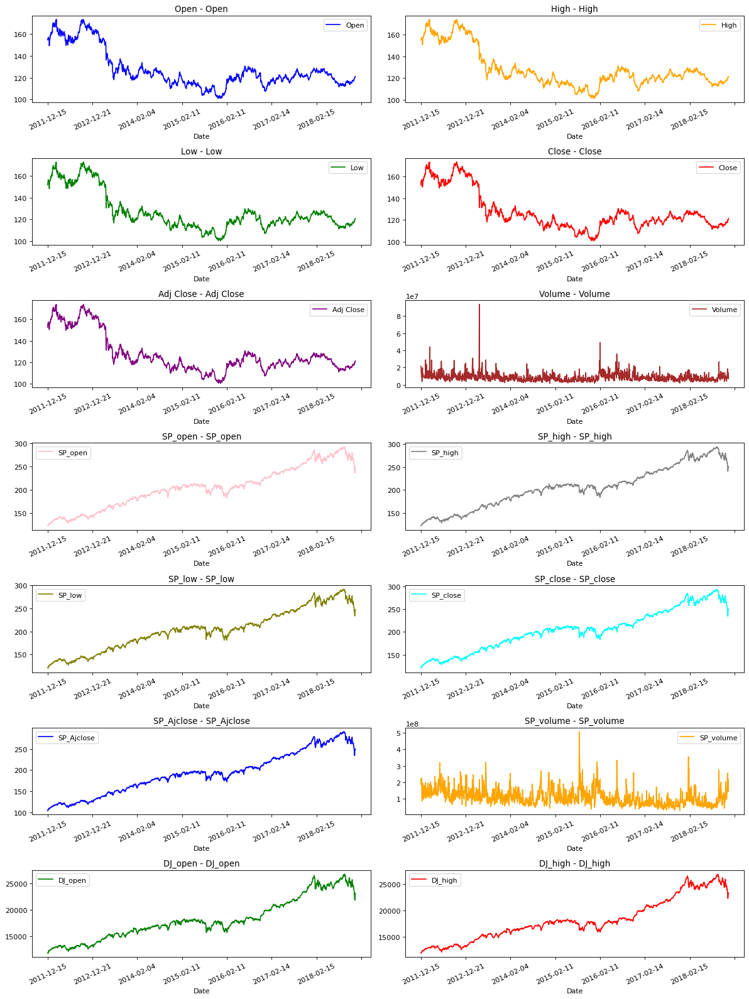

In [10]:
titles = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open', 'SP_high', 'SP_low', 'SP_close', 
          'SP_Ajclose','SP_volume','DJ_open', 'DJ_high' ]
feature_keys = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open', 'SP_high', 'SP_low', 'SP_close',
                'SP_Ajclose', 'SP_volume','DJ_open', 'DJ_high']

colors = [ "blue","orange","green","red","purple","brown","pink","gray","olive", "cyan"]
date_time_key = "Date"
def show_raw_visualization(data):
    time_data = data_gold[date_time_key]
    fig, axes = plt.subplots(
        nrows=7, ncols=2, figsize=(15, 20), dpi=80, facecolor="w", edgecolor="k"
    )
    
    for i in range(len(feature_keys)):
        key = feature_keys[i]
        c = colors[i % (len(colors))]
        t_data = data[key]
        t_data.index = time_data
        t_data.head()
        ax = t_data.plot(
            ax=axes[i // 2, i % 2],
            color=c,
            title="{} - {}".format(titles[i], key),
            rot=25,
        )
        ax.legend([titles[i]])
    plt.tight_layout()


show_raw_visualization(data_gold)

In [11]:
#tranformation des date qui est object en datetime
data_gold['Date'] = pd.to_datetime(data_gold['Date'])

In [12]:
data_gold = data_gold.set_index('Date')

In [13]:
data_gold.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [14]:
data_gold.isnull().mean()

Open             0.0
High             0.0
Low              0.0
Close            0.0
Adj Close        0.0
                ... 
USO_High         0.0
USO_Low          0.0
USO_Close        0.0
USO_Adj Close    0.0
USO_Volume       0.0
Length: 80, dtype: float64

In [15]:
data_gold.index

DatetimeIndex(['2011-12-15', '2011-12-16', '2011-12-19', '2011-12-20',
               '2011-12-21', '2011-12-22', '2011-12-23', '2011-12-27',
               '2011-12-28', '2011-12-29',
               ...
               '2018-12-17', '2018-12-18', '2018-12-19', '2018-12-20',
               '2018-12-21', '2018-12-24', '2018-12-26', '2018-12-27',
               '2018-12-28', '2018-12-31'],
              dtype='datetime64[ns]', name='Date', length=1718, freq=None)

## visualisation des donnnees

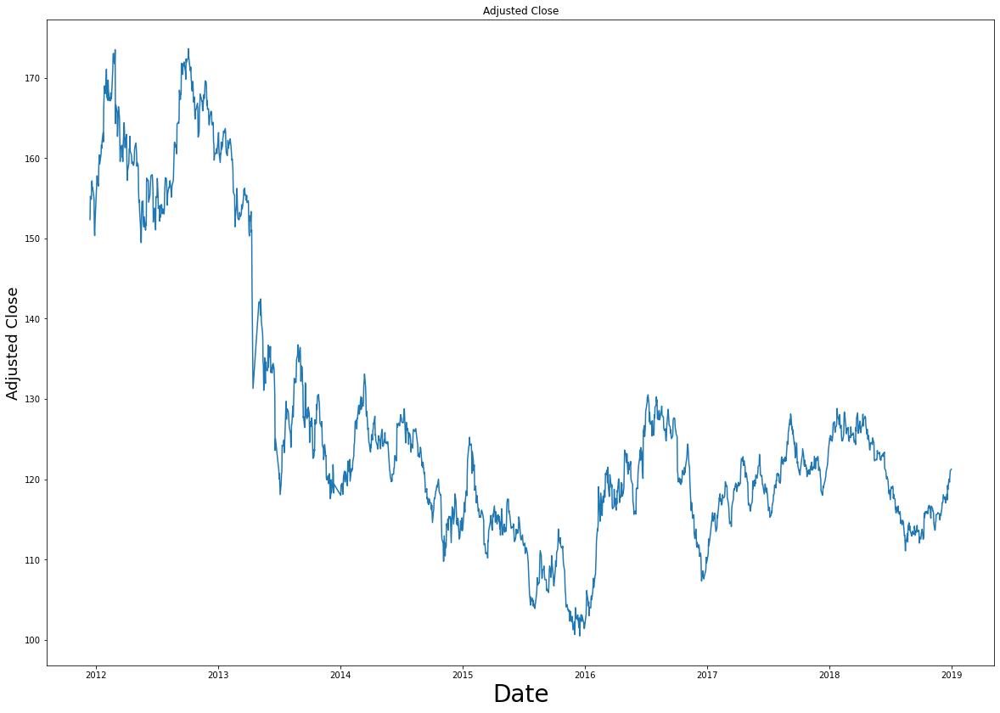

In [16]:
## visualisation de la target 
plt.figure(figsize=(20,14))
plt.title('Adjusted Close')
plt.plot(data_gold['Adj Close'])
plt.xlabel('Date',fontsize=28)
plt.ylabel('Adjusted Close', fontsize=18)
plt.show()

## Interpretation
De la fin de 2011 au début de 2019, le prix de l'or était principalement dans une tendance à la baisse. 
De 2011 a fin 2013 le prix le l or etait en hausse
de fin 2013 jusqu'en 2016 le prix le l'or subit une baisse en passant de 170 à 105.
En 2016-2018, le prix de l'or fluctuait dans une fourchette d'environ 105 à 130. 


## visualisation et Interpretation des features 



In [17]:
# fig = px.line(data_gold, x="Date", y=var,
#               hover_data={"Date": "|%B %d, %Y"},
#               title='custom tick labels')
# fig.update_xaxes(
#     dtick="M1",
#     tickformat="%b\n%Y")
# fig.show()

def visualises(data, title):
    fig = px.line(title = title)
    for i in data_gold.columns:
        fig.add_scatter(x=data_gold.index, y=data[i], name=i)
        fig.update_xaxes(rangeslider_visible=True)
    fig.show()

In [18]:
visualises(data_gold, 'title')

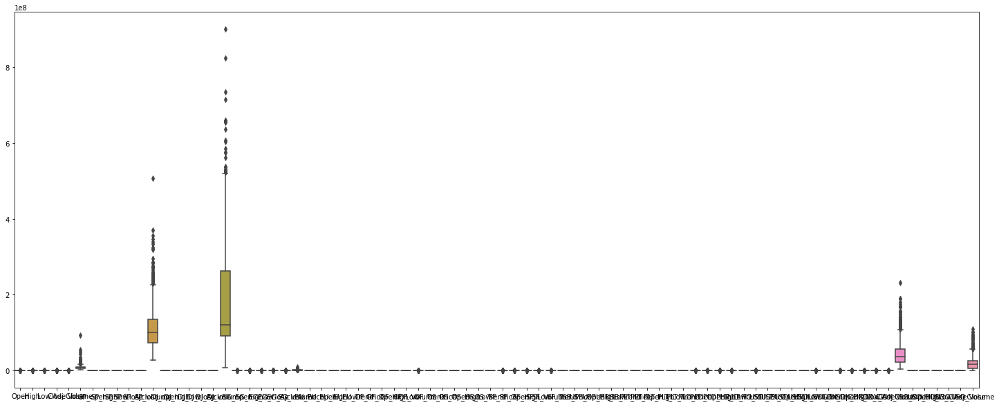

In [19]:
#visualisation des valleurs aberante
plt.figure(figsize=(25, 10))
sns.boxplot(data=data_gold[[col for col in data_gold.select_dtypes(exclude=object) if col not in 'Date']]);

In [24]:
# mormaliser les variables
df_normalizer1 = data_gold[['Adj Close','SP_Ajclose','DJ_Ajclose','EG_Ajclose','EU_Price','OF_Price','OS_Price', 'SF_Price','USB_Price','PLT_Price','PLD_Price','RHO_PRICE','USDI_Price','GDX_Adj Close','USO_Adj Close']]
scaler = RobustScaler()
df_normalizer = scaler.fit_transform(df_normalizer1)
df_normalizer = pd.DataFrame(df_normalizer, columns=df_normalizer1.columns, index=data_gold.index)
df_normalizer.head()

,Adj Close,SP_Ajclose,DJ_Ajclose,EG_Ajclose,EU_Price,OF_Price,OS_Price,SF_Price,USB_Price,PLT_Price,PLD_Price,RHO_PRICE,USDI_Price,GDX_Adj Close,USO_Adj Close
Date,,,,,,,,,,,,,,,
2011-12-15,2.459030,-1.139031,-1.072568,2.112873,0.637348,0.629301,0.633633,1.528017,-0.503072,0.634789,-0.699777,0.622010,-0.851869,4.175865,0.859283
2011-12-16,2.692571,-1.136966,-1.073020,2.197887,0.646549,0.597994,0.641790,1.510964,-0.589808,0.646017,-0.673829,0.574163,-0.858118,4.326350,0.865364
2011-12-19,2.663579,-1.151881,-1.091717,1.764317,0.624899,0.603212,0.648404,1.452916,-0.649078,0.627672,-0.754105,0.574163,-0.860971,4.099116,0.862324
2011-12-20,2.833501,-1.110117,-1.028731,1.862082,0.670365,0.658810,0.680593,1.514352,-0.479942,0.675087,-0.657612,0.574163,-0.856488,4.373001,0.921390
2011-12-21,2.847997,-1.107363,-1.027954,1.925843,0.651962,0.676443,0.756876,1.474757,-0.417781,0.663659,-0.607609,0.574163,-0.851258,4.368486,0.945277


Text(0.4, 0.95, 'Box Plot de Adj Close par rapport à SP_Ajclose, DJ_Ajclose, EG_Ajclose, EU_Price, OF_Price')

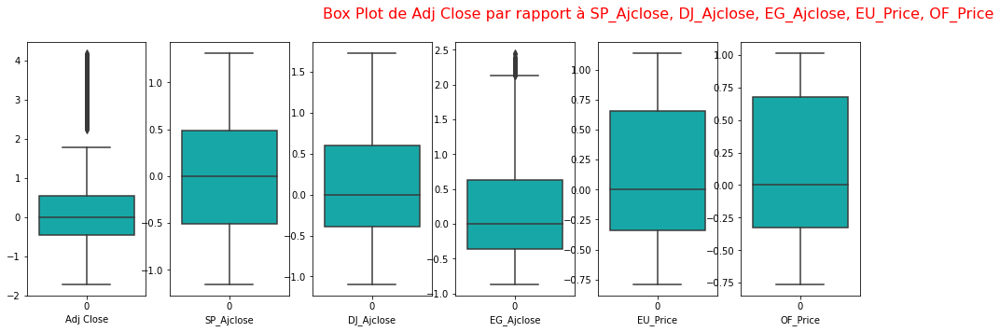

In [28]:
#'Adj Close','SP_Ajclose','DJ_Ajclose','EG_Ajclose','EU_Price','OF_Price','OS_Price', 'SF_Price','USB_Price','PLT_Price','PLD_Price','RHO_PRICE','USDI_Price','GDX_Adj Close','USO_Adj Close'
#créer une figure avec 3 Axes sur la même ligne
fig, ax = plt.subplots(1,6,figsize=(16,5))
#sns.scatterplot(y='tip',x=range(1,245), data=tips,ax=ax[0])
sns.boxplot(data=df_normalizer['Adj Close'], ax=ax[0], color='c')
ax[0].set_xlabel('Adj Close')
sns.boxplot(data=df_normalizer['SP_Ajclose'], ax=ax[1], color='c')
ax[1].set_xlabel('SP_Ajclose')
sns.boxplot(data=df_normalizer['DJ_Ajclose'], ax=ax[2], color='c')
ax[2].set_xlabel('DJ_Ajclose')
sns.boxplot(data=df_normalizer['EG_Ajclose'], ax=ax[3], color='c')
ax[3].set_xlabel('EG_Ajclose')
sns.boxplot(data=df_normalizer['EU_Price'], ax=ax[4], color='c')
ax[4].set_xlabel('EU_Price')
sns.boxplot(data=df_normalizer['OF_Price'], ax=ax[5], color='c')
ax[5].set_xlabel('OF_Price')
#ajouter un texte à une figure
fig.text(0.4, 0.95, 'Box Plot de Adj Close par rapport à SP_Ajclose, DJ_Ajclose, EG_Ajclose, EU_Price, OF_Price', fontsize = 16,color='r')

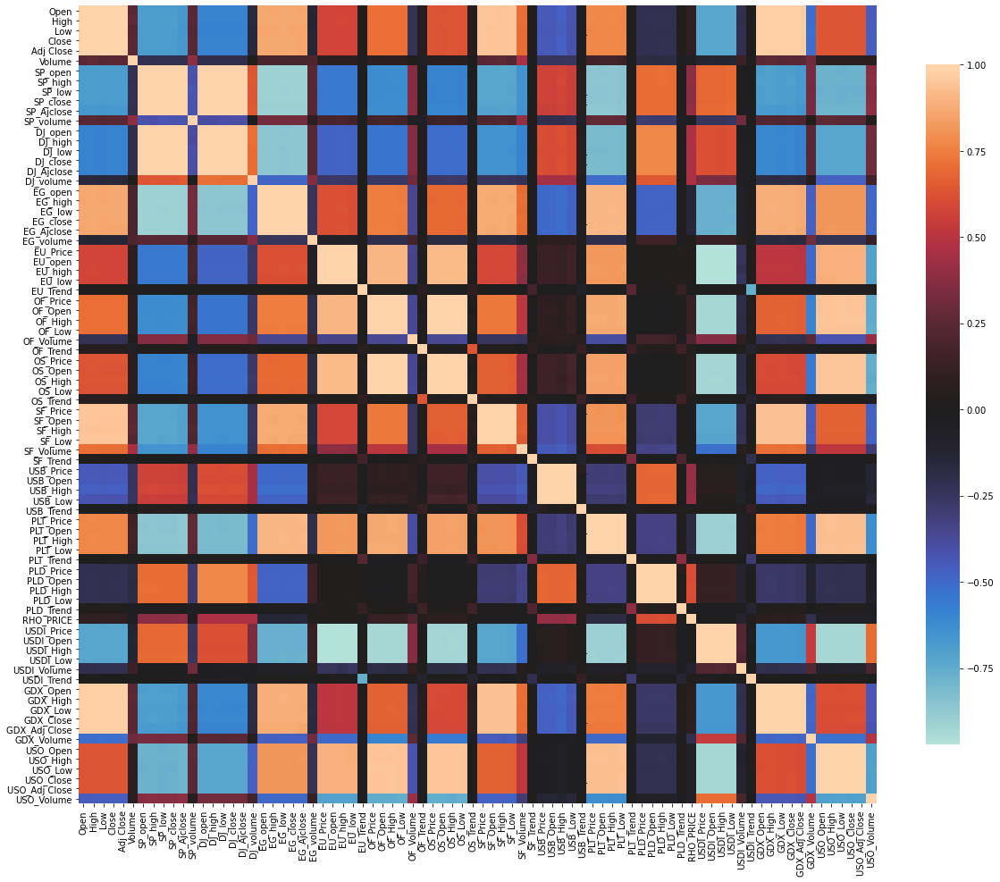

In [32]:
def correlation_heatmap(data):
    correlations = data_gold.corr()

    fig, ax = plt.subplots(figsize=(20,20))
    sns.heatmap(correlations, vmax=1.0, center=0, fmt='.2f',
                square=True, cbar_kws={"shrink": .70})
    plt.show();

correlation_heatmap(data_gold)